In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'customer-segmentation:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F2743505%2F4740787%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240927%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240927T185312Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D32adcf0371e600b0c1d7aedf15f9dfa3a27e785ed7652a878c1a8c6315ded3cb88ab660b5a4175b30bb5f9e47a6c56c3e58a954b76804920bc89f9892e3a676885d8b62498697d16a3b12769514862b033c979eefc88b9035f55578fd7eda4e206fdd1bc10b31ae245798e9461c99503bee282f39d8ab8edb1c95011ae98173397d22ec265d3901ca6244bb16c2c0ab920d251fe6eee9ed02e64a86237e8c49cd788e0abcd9547da3586614cbbf26c5f019d95b4b45fae1c6ccaee84cfbdadd91678d0e2e23830f7e29260c8a658eff705b7e171113473540f5f169e46872bbcb6d0c26f16cc53e0feb78dd959e4592315c2786e413e722c2b8d706031d23286'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 348500 bytes downloaded
Downloaded and uncompressed: customer-segmentation
Data source import complete.


<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <style>
        body {
            font-family: Arial, sans-serif;
            background-color: #e0f7fa; /* Light teal background */
            display: flex;
            justify-content: center;
            align-items: center;
            height: 100vh;
            margin: 0;
        }
        .container {
            background-color: #ffffff;
            padding: 30px 50px;
            border-radius: 12px;
            box-shadow: 0 6px 12px rgba(0, 0, 0, 0.1);
            max-width: 600px;
            text-align: center;
            border-top: 8px solid #00796b; /* Dark teal top border */
        }
        h1 {
            color: #00796b; /* Dark teal for the heading */
            font-size: 26px;
            margin-bottom: 20px;
        }
        p {
            color: #37474f; /* Dark gray for the text */
            font-size: 18px;
            line-height: 1.6;
        }
    </style>
</head>
<body>
    <div class="container">
        <h1>Project Objective</h1>
        <p>To develop a customer segmentation model for a bank’s credit card holders, aimed at understanding customer behavior and improving service offerings.</p>
    </div>
</body>
</html>


<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
        Imports
    </h2>
   
</div>


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
!pip install plotly
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import PowerTransformer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/customer-segmentation/Customer_Data (1).csv


In [ ]:
# reading the data
data = pd.read_csv("/kaggle/input/customer-segmentation/Customer_Data (1).csv")
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
        Data Preprocessing
    </h2>
   
</div>


In [ ]:
# short info of data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [ ]:
#checking the missing values in the dataset
data.isna().sum()

,0
CUST_ID,0
BALANCE,0
BALANCE_FREQUENCY,0
PURCHASES,0
ONEOFF_PURCHASES,0
INSTALLMENTS_PURCHASES,0
CASH_ADVANCE,0
PURCHASES_FREQUENCY,0
ONEOFF_PURCHASES_FREQUENCY,0
PURCHASES_INSTALLMENTS_FREQUENCY,0


In [ ]:
#To remove the NA values
#data = data.dropna()

In [ ]:
# Checking the duplicate rows
print('Number of duplicated rows: ' , len(data[data.duplicated()]))

Number of duplicated rows:  0


In [ ]:
# Imputing the nan values
data['CREDIT_LIMIT'].fillna(data['CREDIT_LIMIT'].median(), inplace=True)
data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].median(), inplace=True)
print(data.isnull().sum())

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64


In [ ]:
# dropping the "CUST_ID" column
data.drop( 'CUST_ID' , axis = 1 , inplace = True)
data.head(5)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,312.343947,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [ ]:
# Creating new features using the existing features
data['TOTAL_TRANSACTIONS'] = data['PURCHASES_TRX'] + data['CASH_ADVANCE_TRX'] # TOTAL_TRANSACTIONS
data['CREDIT_UTILIZATION_RATIO'] = data['BALANCE'] / data['CREDIT_LIMIT'] # CREDIT_UTILIZATION_RATIO
data['TOTAL_PURCHASE_FREQUENCY'] = data['PURCHASES_FREQUENCY'] + data['PURCHASES_INSTALLMENTS_FREQUENCY'] # TOTAL_PURCHASE_FREQUENCY
data['REGULAR_PAYERS'] = (data['PRC_FULL_PAYMENT'] > 0.5).astype(int) # Payment_Regularity
data.head(5)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,TOTAL_TRANSACTIONS,CREDIT_UTILIZATION_RATIO,TOTAL_PURCHASE_FREQUENCY,REGULAR_PAYERS
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,...,2,1000.0,201.802084,139.509787,0.000000,12,2,0.040901,0.250000,0
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,...,0,7000.0,4103.032597,1072.340217,0.222222,12,4,0.457495,0.000000,0
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,...,12,7500.0,622.066742,627.284787,0.000000,12,12,0.332687,1.000000,0
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,...,1,7500.0,0.000000,312.343947,0.000000,12,2,0.222223,0.083333,0
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,...,1,1200.0,678.334763,244.791237,0.000000,12,1,0.681429,0.083333,0


In [ ]:
data.describe()[1:].T.style.background_gradient(cmap='plasma', axis=1)

,mean,std,min,25%,50%,75%,max
BALANCE,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.138560
BALANCE_FREQUENCY,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.000000
PURCHASES,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.570000
ONEOFF_PURCHASES,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.250000
INSTALLMENTS_PURCHASES,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.000000
CASH_ADVANCE,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.211760
PURCHASES_FREQUENCY,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.000000
ONEOFF_PURCHASES_FREQUENCY,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.000000
PURCHASES_INSTALLMENTS_FREQUENCY,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.000000
CASH_ADVANCE_FREQUENCY,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.500000


<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
Exploratory Data Analysis (EDA)
    </h2>
   
</div>


In [ ]:
columns = [
    'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES',
    'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
    'CASH_ADVANCE_FREQUENCY', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS',
    'PRC_FULL_PAYMENT', 'TENURE', 'TOTAL_TRANSACTIONS', 'CREDIT_UTILIZATION_RATIO',
    'TOTAL_PURCHASE_FREQUENCY', 'REGULAR_PAYERS'
]

sns.set(style="darkgrid")

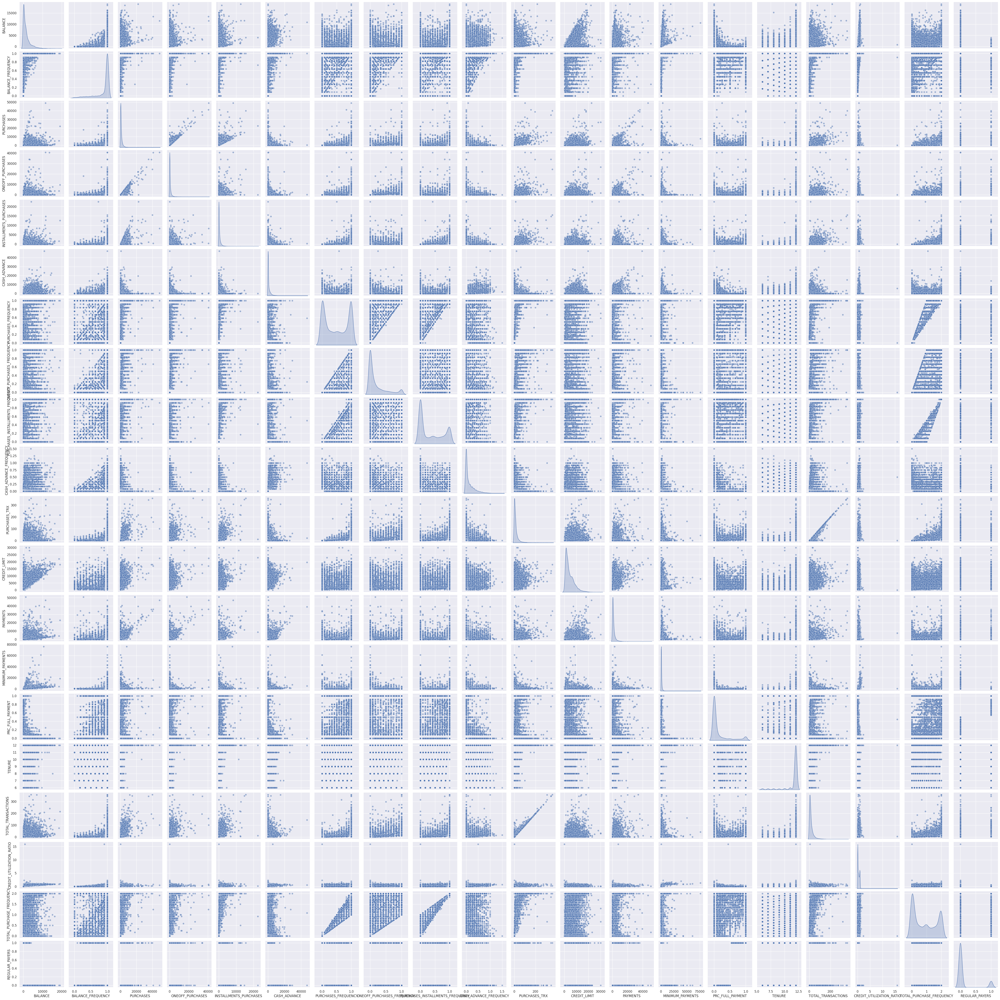

In [ ]:
sns.pairplot(data[columns], diag_kind='kde', plot_kws={'alpha':0.5})
plt.show()

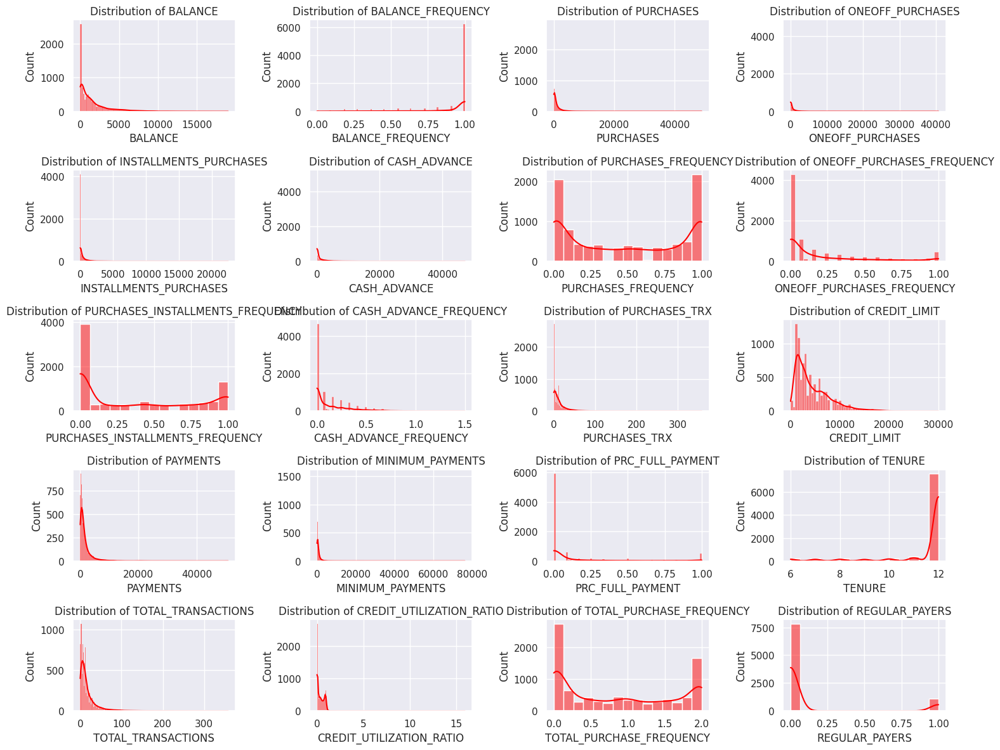

In [ ]:
# plotting the distribution of the data
plt.figure(figsize=(15, 12))
for i, col in enumerate(columns, 1):
    plt.subplot(5, 4, i)
    sns.histplot(data[col], kde=True, color='red')
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

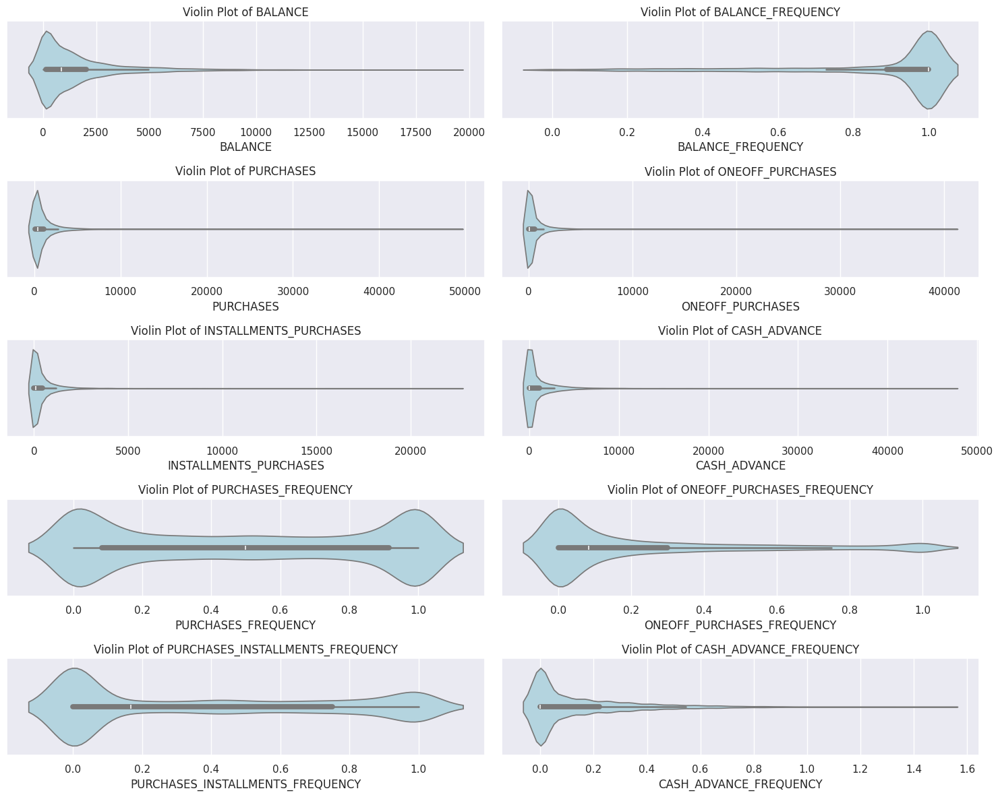

In [ ]:
# Combine the benefits of boxplots and KDE to show the distribution of data.
plt.figure(figsize=(15, 12))
for i, col in enumerate(columns[:10], 1):
    plt.subplot(5, 2, i)
    sns.violinplot(x=data[col], color='lightblue')
    plt.title(f'Violin Plot of {col}')
plt.tight_layout()
plt.show()

In [ ]:
# Using the right transform to change the distribution of columns
data_transformed = data.copy()

log_transform_cols = ['BALANCE', 'PURCHASES', 'CASH_ADVANCE', 'PAYMENTS', 'MINIMUM_PAYMENTS']
data_transformed[log_transform_cols] = data[log_transform_cols].apply(lambda x: np.log1p(x))

sqrt_transform_cols = ['PURCHASES_TRX', 'TOTAL_TRANSACTIONS']
data_transformed[sqrt_transform_cols] = data[sqrt_transform_cols].apply(lambda x: np.sqrt(x))

boxcox_transform_cols = [ 'PURCHASES_INSTALLMENTS_FREQUENCY', 'PRC_FULL_PAYMENT']

pt = PowerTransformer(method='yeo-johnson')
data_transformed[boxcox_transform_cols] = pd.DataFrame(pt.fit_transform(data[boxcox_transform_cols]),
                                                     columns=boxcox_transform_cols)

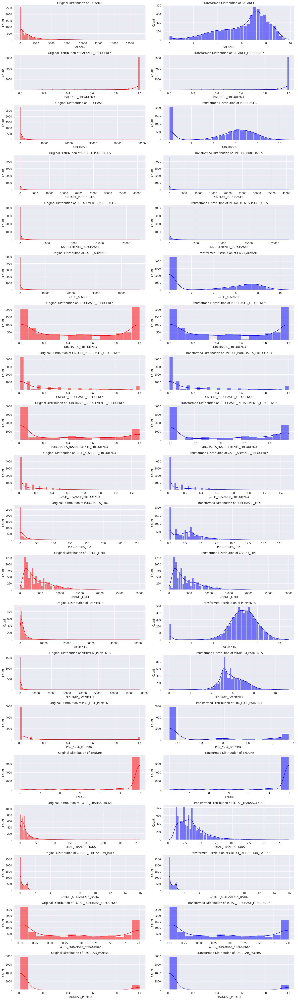

In [ ]:
# Plotting
fig, axes = plt.subplots(len(columns), 2, figsize=(18, 60))

for i, col in enumerate(columns):

    sns.histplot(data[col], kde=True, ax=axes[i, 0], color='red')
    axes[i, 0].set_title(f'Original Distribution of {col}')

    sns.histplot(data_transformed[col], kde=True, ax=axes[i, 1], color='blue')
    axes[i, 1].set_title(f'Transformed Distribution of {col}')

plt.tight_layout()
plt.show()


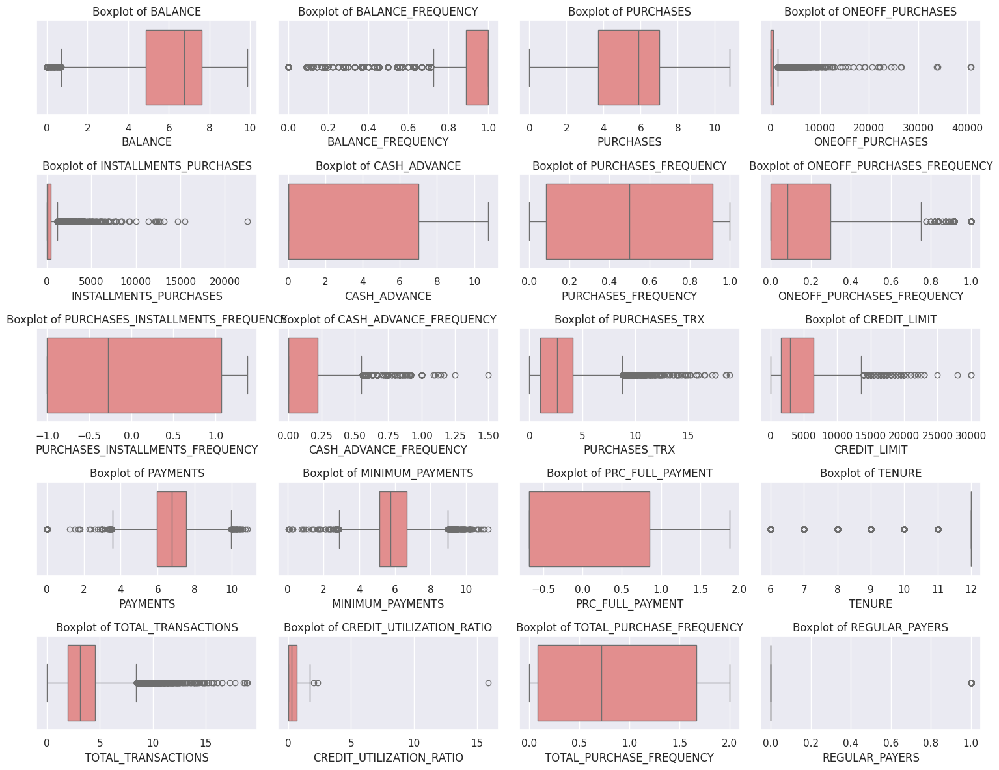

In [ ]:
# plotting the Boxplots for outlier detection
plt.figure(figsize=(15, 12))
for i, col in enumerate(columns, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(x=data_transformed[col], color='lightcoral')
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

In [ ]:
# Removing the outliers
outliers_columns = [ 'CREDIT_LIMIT', 'TOTAL_TRANSACTIONS', 'CREDIT_UTILIZATION_RATIO' , 'PAYMENTS', 'MINIMUM_PAYMENTS', 'BALANCE', 'ONEOFF_PURCHASES' ]

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.15)
    Q3 = df[column].quantile(0.85)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

for col in outliers_columns:
    data_transformed = remove_outliers(data_transformed, col)

data_transformed.describe()[1:].T.style.background_gradient(cmap='plasma', axis=1)

,mean,std,min,25%,50%,75%,max
BALANCE,6.159835,1.955671,0.000000,4.841781,6.771197,7.587830,9.687605
BALANCE_FREQUENCY,0.885069,0.222177,0.000000,0.900000,1.000000,1.000000,1.000000
PURCHASES,4.717701,2.849368,0.000000,3.268047,5.798183,6.857924,9.442895
ONEOFF_PURCHASES,333.139517,560.972935,0.000000,0.000000,0.000000,448.070000,2715.520000
INSTALLMENTS_PURCHASES,348.392080,665.150082,0.000000,0.000000,79.870000,434.440000,12541.000000
CASH_ADVANCE,3.392545,3.566886,0.000000,0.000000,0.000000,7.047094,10.284766
PURCHASES_FREQUENCY,0.474011,0.398139,0.000000,0.083333,0.416667,0.916667,1.000000
ONEOFF_PURCHASES_FREQUENCY,0.174192,0.270551,0.000000,0.000000,0.000000,0.250000,1.000000
PURCHASES_INSTALLMENTS_FREQUENCY,-0.019605,0.995512,-1.004445,-1.004445,-0.273845,1.069884,1.377136
CASH_ADVANCE_FREQUENCY,0.139444,0.201870,0.000000,0.000000,0.000000,0.250000,1.500000


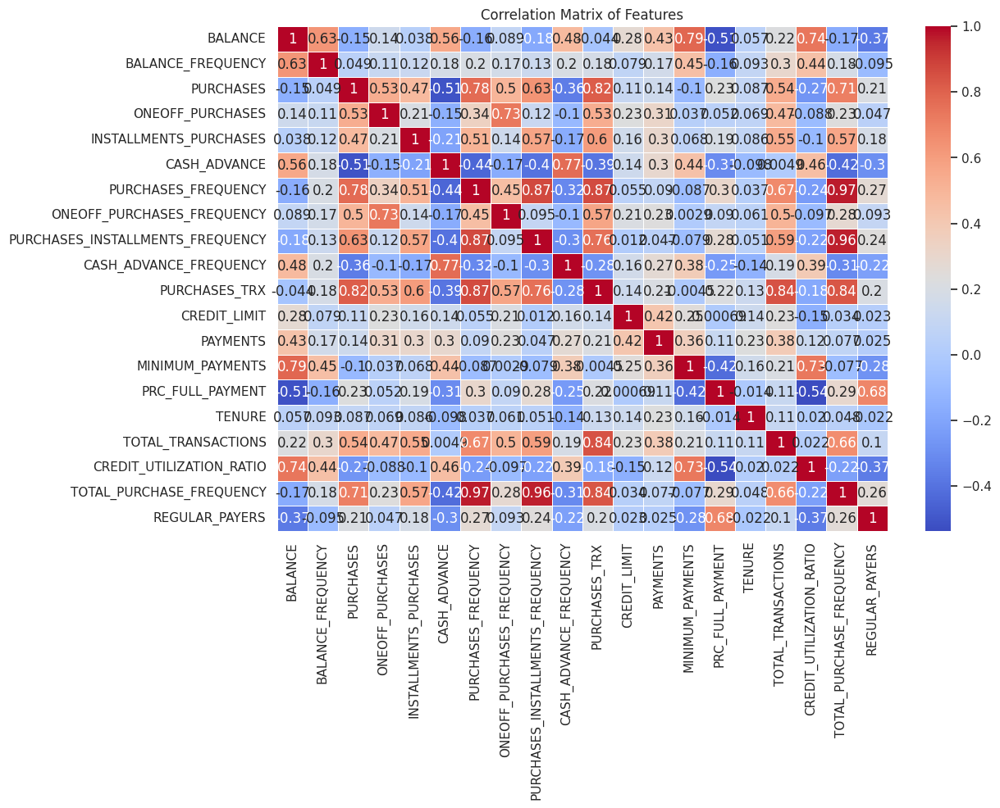

In [ ]:
# plotting the Correlation Matrix (Heatmap)
plt.figure(figsize=(12, 8))
corr_matrix = data_transformed[columns].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Features')
plt.show()

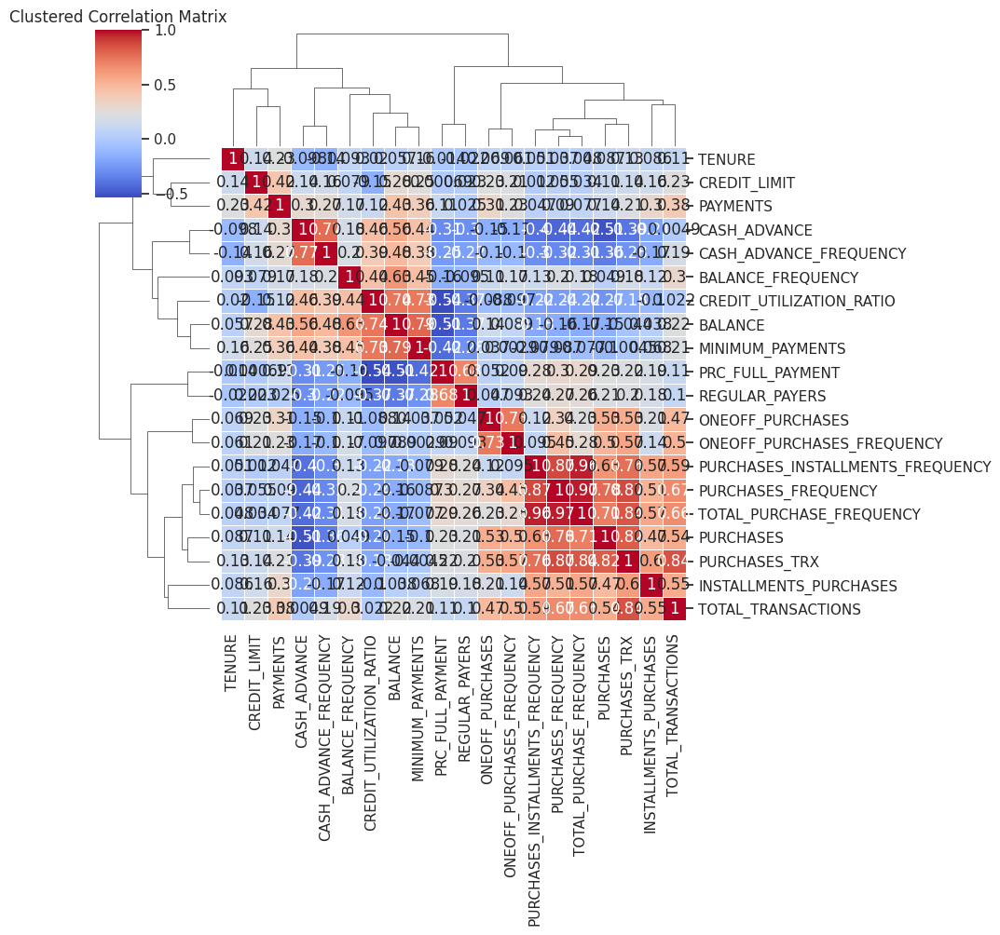

In [ ]:
# To Identify the potential clusters in the correlation matrix or feature space.
sns.clustermap(corr_matrix, cmap='coolwarm', annot=True, linewidths=.5)
plt.title('Clustered Correlation Matrix')
plt.show()

In [ ]:
# reducing the data dimension and plotting it in 3D graph
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_transformed)

pca = PCA(n_components=3)
pca_result = pca.fit_transform(data_scaled)
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2', 'PC3'])

fig = px.scatter_3d(
    pca_df,
    x='PC1',
    y='PC2',
    z='PC3',
    title='3D PCA Scatter Plot',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'},
    color=pca_df['PC1'],
    opacity=0.7
)

fig.show()


In [ ]:
# reducing the data dimension and plotting it in 2D graph
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_transformed)

pca = PCA(n_components=2)
pca_result = pca.fit_transform(data_scaled)

pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

fig = px.scatter(
    pca_df,
    x='PC1',
    y='PC2',
    title='2D PCA Scatter Plot',
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2'},
    color=pca_df['PC1'],
    opacity=0.7
)

fig.show()


<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
        4 clusters can be seen in the plotting, Let's see it using K-Means
    </h2>
   
</div>


<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
Modeling
    </h2>
   
</div>


In [ ]:
data_transformed.head(5)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,TOTAL_TRANSACTIONS,CREDIT_UTILIZATION_RATIO,TOTAL_PURCHASE_FREQUENCY,REGULAR_PAYERS
0,3.735304,0.818182,4.568506,0.00,95.40,0.000000,0.166667,0.000000,-0.606642,0.00,...,1.414214,1000.0,5.312231,4.945277,-0.677889,12,1.414214,0.040901,0.250000,0
1,8.071989,0.909091,0.000000,0.00,0.00,8.770896,0.000000,0.000000,-1.004445,0.25,...,0.000000,7000.0,8.319725,6.978531,1.235021,12,2.000000,0.457495,0.000000,0
2,7.822504,1.000000,6.651791,773.17,0.00,0.000000,1.000000,1.000000,-1.004445,0.00,...,3.464102,7500.0,6.434654,6.442994,-0.677889,12,3.464102,0.332687,1.000000,0
4,6.707735,1.000000,2.833213,16.00,0.00,0.000000,0.083333,0.083333,-1.004445,0.00,...,1.000000,1200.0,6.521114,5.504483,-0.677889,12,1.000000,0.681429,0.083333,0
5,7.501540,1.000000,7.196147,0.00,1333.28,0.000000,0.666667,0.000000,0.801521,0.00,...,2.828427,1800.0,7.244983,7.786654,-0.677889,12,2.828427,1.005460,1.250000,0


In [ ]:
data_scaled = scaler.fit_transform(data_transformed)

<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
K-Means
    </h2>
   
</div>


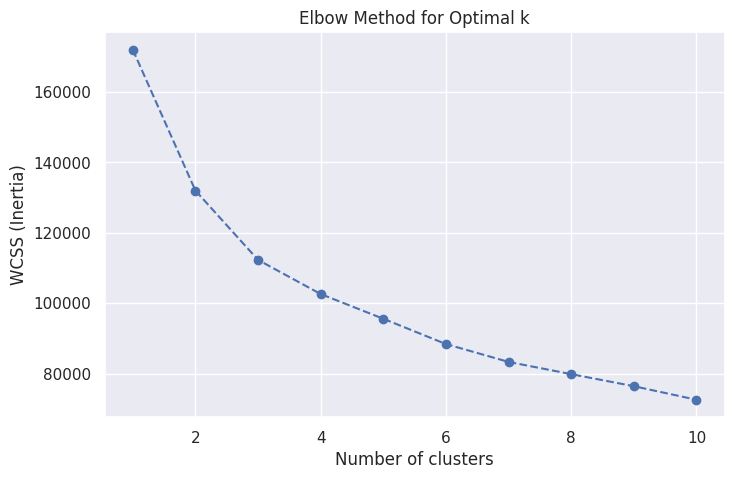

In [ ]:
# Finding the optimal number of clusters using the elbow method
wcss = []
end = 11
for i in range(1, end):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)


plt.figure(figsize=(8, 5))
plt.plot(range(1, end), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS (Inertia)')
plt.show()


In [ ]:
optimal_k = 3

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(data_scaled)

silhouette_avg = silhouette_score(data_scaled, cluster_labels)
print(f'Silhouette Score for {optimal_k} clusters: {silhouette_avg}')

Silhouette Score for 3 clusters: 0.22146808216836564


In [ ]:
# Selecting the important features
data_scaled_df = pd.DataFrame(data_scaled, columns=data_transformed.columns)
data_scaled_df['Cluster'] = cluster_labels

N = 15 # Top 15 out of 21

feature_variance = data_scaled_df.groupby('Cluster').var().mean()
important_columns = feature_variance.sort_values().index[:N]

data_important = data_scaled_df[important_columns]
data_important.head(5)

,PURCHASES_FREQUENCY,PURCHASES_TRX,BALANCE,PURCHASES,TOTAL_PURCHASE_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CREDIT_UTILIZATION_RATIO,TOTAL_TRANSACTIONS,CASH_ADVANCE,MINIMUM_PAYMENTS,CASH_ADVANCE_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,BALANCE_FREQUENCY,ONEOFF_PURCHASES,CASH_ADVANCE_TRX
0,-0.771999,-0.557296,-1.239819,-0.052364,-0.756292,-0.589720,-0.999004,-1.082675,-0.951181,-0.831000,-0.690805,-0.64388,-0.301073,-0.593896,-0.490453
1,-1.190640,-1.202363,0.977808,-1.655802,-1.082285,-0.989341,0.172782,-0.765613,1.507948,0.941975,0.547693,-0.64388,0.108126,-0.593896,0.100927
2,1.321200,0.377722,0.850230,0.678820,0.221688,-0.989341,-0.178277,0.026845,-0.951181,0.474993,-0.690805,3.05250,0.517324,0.784454,-0.490453
3,-0.981321,-0.746232,0.280177,-0.661411,-0.973621,-0.989341,0.802656,-1.306872,-0.951181,-0.343379,-0.690805,-0.33585,0.517324,-0.565373,-0.490453
4,0.483921,0.087771,0.686101,0.869876,0.547682,0.824879,1.714084,-0.317219,-0.951181,1.646650,-0.690805,-0.64388,0.517324,-0.593896,-0.490453


In [ ]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(data_important)

silhouette_avg = silhouette_score(data_important, cluster_labels)
print(f'Silhouette Score for {optimal_k} clusters: {silhouette_avg}')

Silhouette Score for 3 clusters: 0.2734633448564218


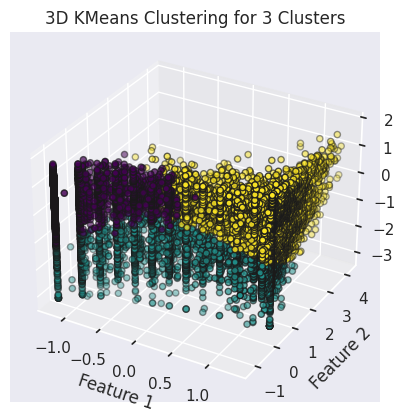

In [ ]:
data_array = data_important.iloc[:, :3].values  # Assuming data_important is a DataFrame

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(data_array)

x_min, x_max = data_array[:, 0].min() - 1, data_array[:, 0].max() + 1
y_min, y_max = data_array[:, 1].min() - 1, data_array[:, 1].max() + 1
z_min, z_max = data_array[:, 2].min() - 1, data_array[:, 2].max() + 1

xx, yy, zz = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1),
                         np.arange(z_min, z_max, 0.1))

predicted_labels = kmeans.predict(np.c_[xx.ravel(), yy.ravel(), zz.ravel()])
predicted_labels = predicted_labels.reshape(xx.shape)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(data_array[:, 0], data_array[:, 1], data_array[:, 2], c=cluster_labels, cmap='viridis', edgecolor='k')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')
plt.title(f'3D KMeans Clustering for {optimal_k} Clusters')
plt.show()


In [ ]:
data_array = data_important.iloc[:, :3].values

kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(data_array)

df_plot = pd.DataFrame(data_array, columns=['Feature 1', 'Feature 2', 'Feature 3'])
df_plot['Cluster'] = cluster_labels

fig = px.scatter_3d(df_plot, x='Feature 1', y='Feature 2', z='Feature 3', color='Cluster',
                    title=f'3D KMeans Clustering for {optimal_k} Clusters',
                    labels={'Cluster': 'Cluster Labels'},
                    color_continuous_scale=px.colors.sequential.Viridis)

fig.show()


<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
AgglomerativeClustering
    </h2>
   
</div>


In [ ]:
# Using the AgglomerativeClustering

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

agg_clustering = AgglomerativeClustering(n_clusters=3)
cluster_labels_agg = agg_clustering.fit_predict(data_transformed)

silhouette_avg_agg = silhouette_score(data_transformed, cluster_labels_agg)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_agg}')


Silhouette Score for Agglomerative Clustering: 0.5786561896514361


Silhouette Score for Agglomerative Clustering: 0.4885792348608667


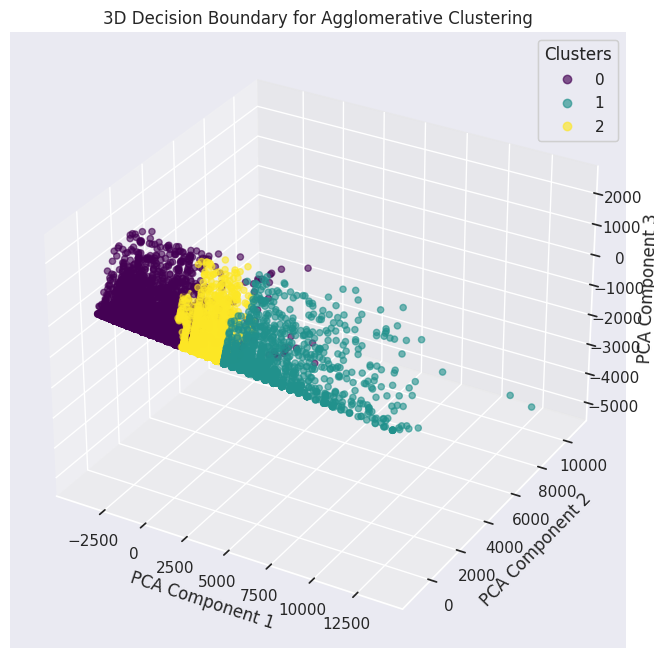

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score


pca = PCA(n_components=3)
data_reduced = pca.fit_transform(data_transformed)

agg_clustering = AgglomerativeClustering(n_clusters=3)
cluster_labels_agg = agg_clustering.fit_predict(data_reduced)

silhouette_avg_agg = silhouette_score(data_reduced, cluster_labels_agg)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_agg}')

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(data_reduced[:, 0], data_reduced[:, 1], data_reduced[:, 2],
                     c=cluster_labels_agg, cmap='viridis', marker='o', alpha=0.6)

legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3')
ax.set_title('3D Decision Boundary for Agglomerative Clustering')

plt.show()


In [ ]:
import numpy as np
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

pca = PCA(n_components=3)
data_reduced = pca.fit_transform(data_transformed)

agg_clustering = AgglomerativeClustering(n_clusters=3)
cluster_labels_agg = agg_clustering.fit_predict(data_reduced)

silhouette_avg_agg = silhouette_score(data_reduced, cluster_labels_agg)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_agg}')

fig = px.scatter_3d(
    x=data_reduced[:, 0],
    y=data_reduced[:, 1],
    z=data_reduced[:, 2],
    color=cluster_labels_agg,
    labels={'x': 'PCA Component 1', 'y': 'PCA Component 2', 'z': 'PCA Component 3'},
    title='3D Decision Boundary for Agglomerative Clustering',
    color_continuous_scale=px.colors.sequential.Viridis
)

fig.show()


Silhouette Score for Agglomerative Clustering: 0.4885792348608667


In [ ]:
import numpy as np
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

pca = PCA(n_components=2)
data_reduced = pca.fit_transform(data_transformed)

agg_clustering = AgglomerativeClustering(n_clusters=3)
cluster_labels_agg = agg_clustering.fit_predict(data_reduced)

silhouette_avg_agg = silhouette_score(data_reduced, cluster_labels_agg)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_agg}')

fig = px.scatter(
    x=data_reduced[:, 0],
    y=data_reduced[:, 1],
    color=cluster_labels_agg,
    labels={'x': 'PCA Component 1', 'y': 'PCA Component 2'},
    title='2D Decision Boundary for Agglomerative Clustering',
    color_continuous_scale=px.colors.sequential.Viridis
)

fig.show()


Silhouette Score for Agglomerative Clustering: 0.5671559384890258


<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
Minisom
    </h2>
   
</div>


In [ ]:
!pip install minisom

In [ ]:
from minisom import MiniSom
from sklearn.metrics import silhouette_score
import numpy as np

som = MiniSom(x=5, y=5, input_len=21, sigma=1.0, learning_rate=0.5)
som.random_weights_init(data_transformed.values)
som.train_random(data_transformed.values, num_iteration=1000)

clusters = np.zeros(data_transformed.shape[0])

for i, x in enumerate(data_transformed.values):
    win_position = som.winner(x)
    clusters[i] = win_position[0] * som.get_weights().shape[1] + win_position[1]

score = silhouette_score(data_transformed, clusters)
score

0.344045050643847

<!-- Data Preprocessing Section in HTML and CSS -->
<div style="background-color: #f0f8ff; padding: 20px; border-radius: 10px; box-shadow: 0px 4px 6px rgba(0, 0, 0, 0.1);">
    <h2 style="color: #4b0082; font-family: Arial, sans-serif; text-align: center;">
Based on the results, we can conclude that Agglomerative Clustering is the most suitable machine learning algorithm for this problem. Therefore, we will proceed with hyperparameter tuning to further optimize the model's performance.
    </h2>
   
</div>


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering

n_clusters = 3

agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
cluster_labels = agg_clustering.fit_predict(data_transformed)

silhouette_avg = silhouette_score(data_transformed, cluster_labels)

print(f'Silhouette Score: {silhouette_avg}')


Silhouette Score: 0.5786561896514361


In [ ]:
import numpy as np
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

pca = PCA(n_components=3)
data_reduced = pca.fit_transform(data_transformed)

agg_clustering = AgglomerativeClustering(n_clusters=3)
cluster_labels_agg = agg_clustering.fit_predict(data_reduced)

silhouette_avg_agg = silhouette_score(data_reduced, cluster_labels_agg)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_agg}')

fig = px.scatter_3d(
    x=data_reduced[:, 0],
    y=data_reduced[:, 1],
    z=data_reduced[:, 2],
    color=cluster_labels_agg,
    labels={'x': 'PCA Component 1', 'y': 'PCA Component 2', 'z': 'PCA Component 3'},
    title='3D Decision Boundary for Agglomerative Clustering',
    color_continuous_scale=px.colors.sequential.Viridis
)

fig.show()

Silhouette Score for Agglomerative Clustering: 0.4885792348608667


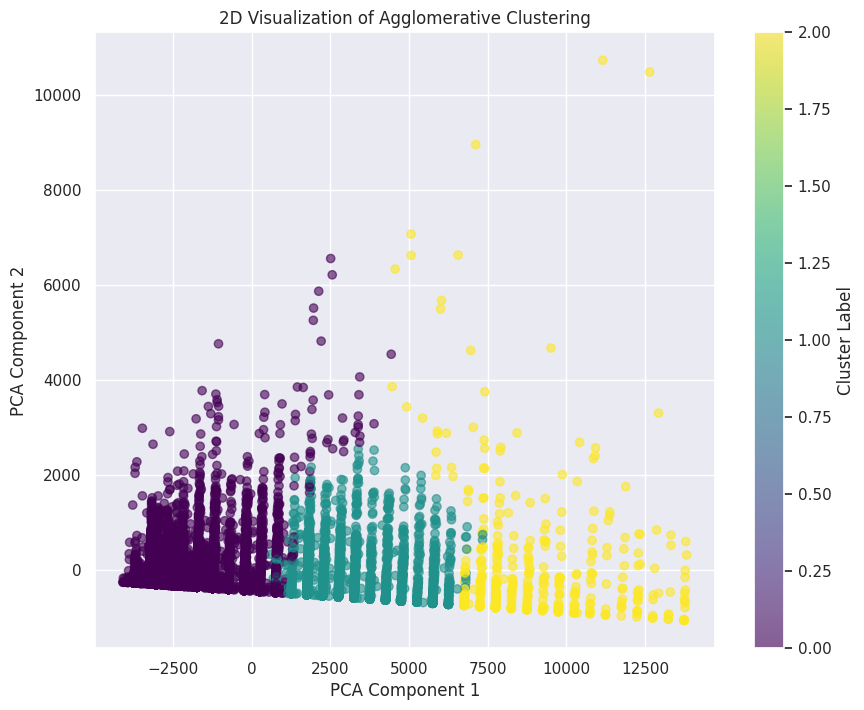

In [ ]:
# 2D Visualization
plt.figure(figsize=(10, 8))
plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=cluster_labels, cmap='viridis', marker='o', alpha=0.6)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('2D Visualization of Agglomerative Clustering')
plt.colorbar(label='Cluster Label')
plt.show()

Silhouette Score: 0.1996

Cluster Means:
             BALANCE  BALANCE_FREQUENCY    PURCHASES  ONEOFF_PURCHASES  \
Cluster                                                                  
0        1755.447033           0.861455   420.518343        289.585929   
1         824.304191           0.897057  1404.258104        685.367821   
2        3939.506973           0.989621  7583.355917       4872.432972   

         INSTALLMENTS_PURCHASES  CASH_ADVANCE  PURCHASES_FREQUENCY  \
Cluster                                                              
0                    131.179816   1320.944216             0.287231   
1                    719.123302    261.564897             0.875874   
2                   2712.589611    703.117266             0.954899   

         ONEOFF_PURCHASES_FREQUENCY  PURCHASES_INSTALLMENTS_FREQUENCY  \
Cluster                                                                 
0                          0.138665                           0.16123   
1                 

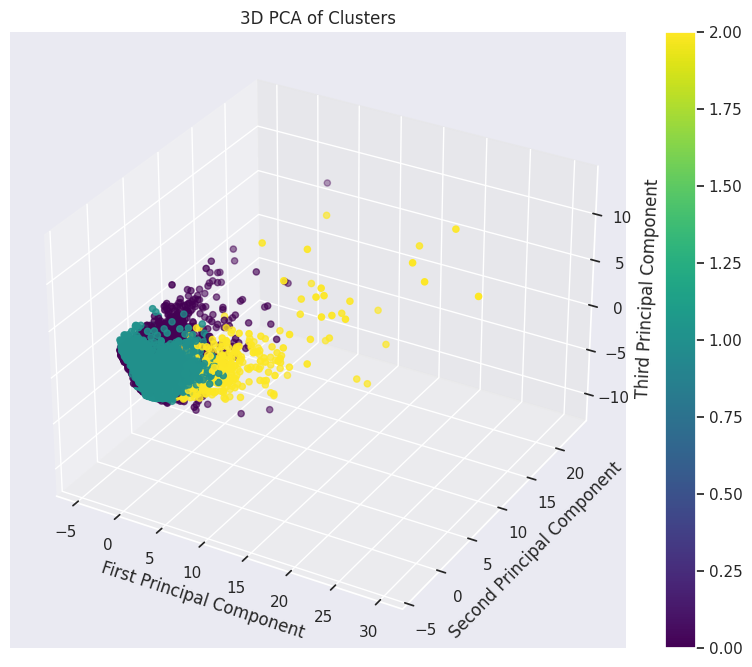


Cluster Profiles:

Cluster 0 Profile:
- High BALANCE
- High BALANCE_FREQUENCY
- High PURCHASES
- High ONEOFF_PURCHASES
- High INSTALLMENTS_PURCHASES
- High CASH_ADVANCE
- High CASH_ADVANCE_TRX
- High PURCHASES_TRX
- High CREDIT_LIMIT
- High PAYMENTS
- High MINIMUM_PAYMENTS
- High TENURE
- High TOTAL_TRANSACTIONS

Cluster 1 Profile:
- High BALANCE
- High BALANCE_FREQUENCY
- High PURCHASES
- High ONEOFF_PURCHASES
- High INSTALLMENTS_PURCHASES
- High CASH_ADVANCE
- High PURCHASES_FREQUENCY
- High PURCHASES_INSTALLMENTS_FREQUENCY
- High CASH_ADVANCE_TRX
- High PURCHASES_TRX
- High CREDIT_LIMIT
- High PAYMENTS
- High MINIMUM_PAYMENTS
- High TENURE
- High TOTAL_TRANSACTIONS
- High TOTAL_PURCHASE_FREQUENCY

Cluster 2 Profile:
- High BALANCE
- High BALANCE_FREQUENCY
- High PURCHASES
- High ONEOFF_PURCHASES
- High INSTALLMENTS_PURCHASES
- High CASH_ADVANCE
- High PURCHASES_FREQUENCY
- High ONEOFF_PURCHASES_FREQUENCY
- High PURCHASES_INSTALLMENTS_FREQUENCY
- High CASH_ADVANCE_TRX
- High PURCHAS

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

def perform_clustering(data, n_clusters=3):

    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters)
    cluster_labels = agg_clustering.fit_predict(data)
    silhouette_avg = silhouette_score(data, cluster_labels)
    return cluster_labels, silhouette_avg

def analyze_clusters(data, cluster_labels):

    data_with_clusters = data.copy()
    data_with_clusters['Cluster'] = cluster_labels
    return data_with_clusters.groupby('Cluster').mean()

def visualize_clusters(data, cluster_labels):

    pca = PCA(n_components=3)
    components = pca.fit_transform(data)

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    scatter = ax.scatter(components[:, 0], components[:, 1], components[:, 2],
                         c=cluster_labels, cmap='viridis')

    ax.set_xlabel('First Principal Component')
    ax.set_ylabel('Second Principal Component')
    ax.set_zlabel('Third Principal Component')
    ax.set_title('3D PCA of Clusters')

    plt.colorbar(scatter)
    plt.show()

def profile_clusters(cluster_means):
    profiles = {}

    for cluster in cluster_means.index:
        profile = f"Cluster {cluster} Profile:\n"

        for feature in cluster_means.columns:
            value = cluster_means.loc[cluster, feature]
            if abs(value) > 0.5:
                direction = "high" if value > 0 else "low"
                profile += f"- {direction.capitalize()} {feature}\n"

        profiles[cluster] = profile.strip()

    return profiles

def suggest_marketing_strategies(profiles, cluster_means):

    strategies = {}

    for cluster, profile in profiles.items():
        strategy = f"Marketing Strategies for Cluster {cluster}:\n"

        if cluster_means.loc[cluster, 'PURCHASES'] > cluster_means['PURCHASES'].mean():
            strategy += "- Offer premium credit card with better rewards for high spenders\n"
            strategy += "- Introduce tiered cashback program based on spending levels\n"

        if cluster_means.loc[cluster, 'PURCHASES_FREQUENCY'] > cluster_means['PURCHASES_FREQUENCY'].mean():
            strategy += "- Develop a loyalty program with points for frequent purchases\n"
            strategy += "- Offer special discounts for reaching purchase milestones\n"

        if cluster_means.loc[cluster, 'CREDIT_LIMIT'] > cluster_means['CREDIT_LIMIT'].mean():
            strategy += "- Promote exclusive experiences or services for high-limit cardholders\n"
            strategy += "- Offer complimentary credit score monitoring and financial advice\n"

        if cluster_means.loc[cluster, 'CASH_ADVANCE'] > cluster_means['CASH_ADVANCE'].mean():
            strategy += "- Provide financial education on responsible credit use\n"
            strategy += "- Offer balance transfer options with low introductory rates\n"

        if cluster_means.loc[cluster, 'CREDIT_UTILIZATION_RATIO'] < cluster_means['CREDIT_UTILIZATION_RATIO'].mean():
            strategy += "- Encourage more card usage with special promotions or bonuses\n"
            strategy += "- Offer incentives for setting up automatic bill payments\n"

        if cluster_means.loc[cluster, 'PRC_FULL_PAYMENT'] > cluster_means['PRC_FULL_PAYMENT'].mean():
            strategy += "- Reward consistent full payments with reduced interest rates\n"
            strategy += "- Offer exclusive partnerships or deals for responsible credit users\n"

        strategies[cluster] = strategy.strip()

    return strategies

if __name__ == "__main__":
    data_scaled = StandardScaler().fit_transform(data)

    cluster_labels, silhouette_avg = perform_clustering(data_scaled)

    print(f"Silhouette Score: {silhouette_avg:.4f}")

    cluster_means = analyze_clusters(data, cluster_labels)

    print("\nCluster Means:")
    print(cluster_means)

    visualize_clusters(data_scaled, cluster_labels)

    profiles = profile_clusters(cluster_means)

    print("\nCluster Profiles:")
    for cluster, profile in profiles.items():
        print(f"\n{profile}")

    strategies = suggest_marketing_strategies(profiles, cluster_means)

    print("\nMarketing Strategies:")
    for cluster, strategy in strategies.items():
        print(f"\n{strategy}")

    with open('cluster_analysis_results.txt', 'w') as f:
        f.write(f"Silhouette Score: {silhouette_avg:.4f}\n\n")
        f.write("Cluster Means:\n")
        f.write(str(cluster_means) + "\n\n")
        f.write("Cluster Profiles:\n")
        for cluster, profile in profiles.items():
            f.write(f"\n{profile}\n")
        f.write("\nMarketing Strategies:\n")
        for cluster, strategy in strategies.items():
            f.write(f"\n{strategy}\n")

    print("\nResults have been saved to 'cluster_analysis_results.txt'")
